In [79]:
import scanpy as sc
import scprep, phate
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import anndata
from sklearn.preprocessing import StandardScaler
from plotly3d.plot import scatter, trajectories

In [80]:
from MIOFlow.utils import generate_steps, set_seeds, config_criterion
from MIOFlow.models import make_model, Autoencoder
from MIOFlow.plots import plot_comparision, plot_losses
from MIOFlow.train import train_ae, training_regimen
from MIOFlow.constants import ROOT_DIR, DATA_DIR, NTBK_DIR, IMGS_DIR, RES_DIR
# from MIOFlow.datasets import (
#     make_diamonds, make_swiss_roll, make_tree, make_eb_data, 
#     make_dyngen_data
# )
from MIOFlow.geo import setup_distance
from MIOFlow.exp import setup_exp
from MIOFlow.eval import generate_plot_data

import os, pandas as pd, numpy as np, \
    seaborn as sns, matplotlib as mpl, matplotlib.pyplot as plt, \
    torch, torch.nn as nn

from tqdm.notebook import tqdm
import time

os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [81]:
data_name = 'ptp'
savepath = f'../data_in_vivo/{data_name}/'

In [82]:
# adata = sc.read_h5ad(f"{savepath}/gaga.h5ad")

In [83]:
# adata = sc.read_h5ad('concat_batches.h5ad')
# data = pd.read_csv('data_for_mioflow/human_latent_v.csv')
data = pd.read_csv(f'../data_in_vivo/mioflow_df_ptp.csv')
exp_name = data_name
exp_dir = f'{savepath}/mioflow_results'

In [84]:
embedding = data[[f'd{i}' for i in range(1, data.shape[1])]].values
samples = data['samples'].values
# mean_ = embedding.mean(axis=0)
# std_ = embedding.std(axis=0)
# just use the first dimension because the later dims are not informative
mean_ = embedding[:,0].mean()
std_ = embedding[:,0].std()
embedding = (embedding - mean_) / std_

In [85]:
# sample_labels = adata.obs['time'].astype(np.int32) 
# embedding = adata.obsm['X_pca'].astype(np.float32) 
# ss = StandardScaler()
# embedding = ss.fit_transform(embedding)
df = pd.DataFrame(embedding, columns=[f'd{i}' for i in range(1, embedding.shape[1]+1)])
df['samples'] = data['samples']
# df = df.sample(n=2000,random_state=1,axis=0) # subsample for faster training
min_count = df['samples'].value_counts().min()
df = df.groupby('samples').apply(lambda x: x.sample(min_count)).reset_index(drop=True)

In [86]:
fig = plt.figure(figsize=(14, 8), dpi=300)
# sns.scatterplot(data=df, x='d1', y='d2', z='d3', hue='samples', palette='viridis');
scatter(df[['d1', 'd2', 'd3']], df['samples'], s=3)

<Figure size 4200x2400 with 0 Axes>

In [87]:
set_seeds(0)
use_cuda = torch.cuda.is_available()

In [88]:
# This is True if we want to holdout (or skip) one timepoint during training. It is used to test the accuracy of the trajectories on unseen data.
hold_one_out = False
# It can be a group number or 'random', works in tandem with hold_one_out
# hold_out = 3

# The dimensions in the input space, it is columns - 1 because we assume one column is equal to "samples".
model_features = len(df.columns) - 1
groups = sorted(df.samples.unique())

In [89]:
# These determine the logic flow for training: 
#   use_emb=True use_gae=False is only the encoder to match the approximation of the geodesic.
#   use_emb=False use_gae=True the full Geodesic Autoencoder (GAE), i.e. matching the geodesic and a reconstruction loss.
#   use_emb=False use_gae=False Is not using the GAE.
#   use_emb=True use_gae=True, is redundant and should raise an error. 
use_emb = False
use_gae = False

need_to_train_gae = (use_emb or use_gae) and use_emb != use_gae

# If the reconstruction loss needs to be computed.
recon = use_gae and not use_emb 

# These are training GAE hyperparameters needed for training
# Distance_type in ['gaussian', 'alpha_decay'], and Gaussian scale
distance_type = 'alpha_decay'
rbf_length_scale=0.001
knn=5
t_max=5
dist = setup_distance(distance_type, rbf_length_scale=rbf_length_scale, knn=knn, t_max=t_max)

#Can be changed depending on the dataset
n_epochs_emb = 1500
samples_size_emb = (50, )

# Layers for the Geodesic Autoencoder
gae_embedded_dim = 50
encoder_layers = [model_features, 100, 100, gae_embedded_dim]

gae = Autoencoder(
    encoder_layers = encoder_layers,
    decoder_layers = encoder_layers[::-1],
    activation='ReLU', use_cuda = use_cuda
)
optimizer = torch.optim.AdamW(gae.parameters())

In [90]:
# Added in extra cell just for iterative programming / running of code
#   but could be added to code block above

if need_to_train_gae:
    start_time_geo = time.time()

    losses = train_ae(
        gae, df, groups, optimizer, 
        n_epochs=n_epochs_emb, sample_size=samples_size_emb,
        noise_min_scale=0.09, noise_max_scale=0.15, 
        dist=dist, recon=recon, use_cuda=use_cuda,
        hold_one_out=False,
    )
    run_time_geo = time.time() - start_time_geo

    print(run_time_geo)
    autoencoder = gae
else:
    autoencoder = None

In [91]:

set_seeds(10)

#Directory where results are saved

# density loss knn
use_density_loss = True

# Weight of density (not percentage of total loss)
# lambda_density = 20
# lambda_density = .5
lambda_density = .5



# For petal=LeakyReLU / dyngen=CELU
activation = 'CELU'

# Can change but we never really do, mostly depends on the dataset.
layers = [16,32,16]

# Scale of the noise in the trajectories. Either len(groups)*[float] or None. Should be None if using an adaptative ODE solver.
# sde_scales = len(groups)*[0.2]

"""
TODO: 
    if we don't rescale data by dim, the later dims are much smaller in magnitude
    this needs the sde_scales to also be scaled by dim -- e.g. some constant times the std of that dim
    this is not implemented yet. 
    So we just use ODE here. need to implement the scales by dim.
"""
sde_scales = None 

if recon:    
    model_features = gae_embedded_dim

model = make_model(
    model_features, layers, 
    activation=activation, scales=sde_scales, use_cuda=use_cuda
)

In [92]:
# Basically "batch size"
sample_size=(min(min_count, 100), )

# Training specification
n_local_epochs = 40
# n_epochs = 40
n_epochs = 25
n_post_local_epochs = 0

# Using the reverse trajectories to train
reverse_schema = True
# reverse_schema = False
# each reverse_n epoch
reverse_n = 2


criterion_name = 'ot'
criterion = config_criterion(criterion_name)

optimizer = torch.optim.AdamW(model.parameters())

# Bookkeeping variables
batch_losses = []
globe_losses = []
if hold_one_out and hold_out in groups:
    groups_ho = [g for g in groups if g != hold_out]
    local_losses = {f'{t0}:{t1}':[] for (t0, t1) in generate_steps(groups_ho)}
else:
    local_losses = {f'{t0}:{t1}':[] for (t0, t1) in generate_steps(groups)}

# For creating output.
n_points = min(min_count, 100)
n_trajectories = min(min_count, 100)
n_bins = 100 # corrected.

In [93]:
opts = {
    'pca_dims': 100,
    'use_cuda': use_cuda,
    'model_features': model_features,
    'exp_name': exp_name,
    'groups': groups,
    'sample_size': sample_size,
    'use_emb': use_emb,
    'n_local_epochs': n_local_epochs,
    'n_epochs': n_epochs,
    'n_post_local_epochs': n_post_local_epochs,
    'criterion_name': criterion_name,
    'hold_one_out': hold_one_out,
    'use_density_loss': use_density_loss,
    'n_points': n_points,
    'n_trajectories': n_trajectories,
    'n_bins': n_bins,
    'autoencoder': autoencoder,
    'activation_ode': activation,
    'layer': layers,
    'lambda_density':lambda_density,
    'use_gae': use_gae,
    'sde_scales': sde_scales,
    'encoder_layers': encoder_layers,
    'n_epochs_emb': n_epochs_emb,
    'samples_size_emb': samples_size_emb,
    'recon': recon,
    'distance_type':distance_type,
    'rbf_length_scale':rbf_length_scale,
    'reverse_schema': reverse_schema,
    'reverse_n': reverse_n,
    'knn': knn,
    't_max': t_max
}

In [94]:
exp_dir1, logger = setup_exp(RES_DIR, opts, exp_name) 

In [95]:
start_time = time.time()
local_losses, batch_losses, globe_losses = training_regimen(
    # local, global, local train structure
    n_local_epochs=n_local_epochs, 
    n_epochs=n_epochs, 
    n_post_local_epochs=n_post_local_epochs,
    
    # where results are stored
    exp_dir=exp_dir, 

    # BEGIN: train params
    model=model, df=df, groups=groups, optimizer=optimizer, 
    criterion=criterion, use_cuda=use_cuda,
    
    hold_one_out=hold_one_out,
    
    use_density_loss=use_density_loss, 
    lambda_density=lambda_density,
    
    autoencoder=autoencoder, use_emb=use_emb, use_gae=use_gae, 
    
    sample_size=sample_size, logger=logger,
    reverse_schema=reverse_schema, reverse_n=reverse_n,
    # END: train params

    plot_every=5,
    n_points=n_points, n_trajectories=n_trajectories, n_bins=n_bins, 
    #local_losses=local_losses, batch_losses=batch_losses, globe_losses=globe_losses
)
run_time = time.time() - start_time + run_time_geo if use_emb or use_gae else time.time() - start_time
logger.info(f'Total run time: {np.round(run_time, 5)}')

Pretraining Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Posttraining Epoch: 0it [00:00, ?it/s]

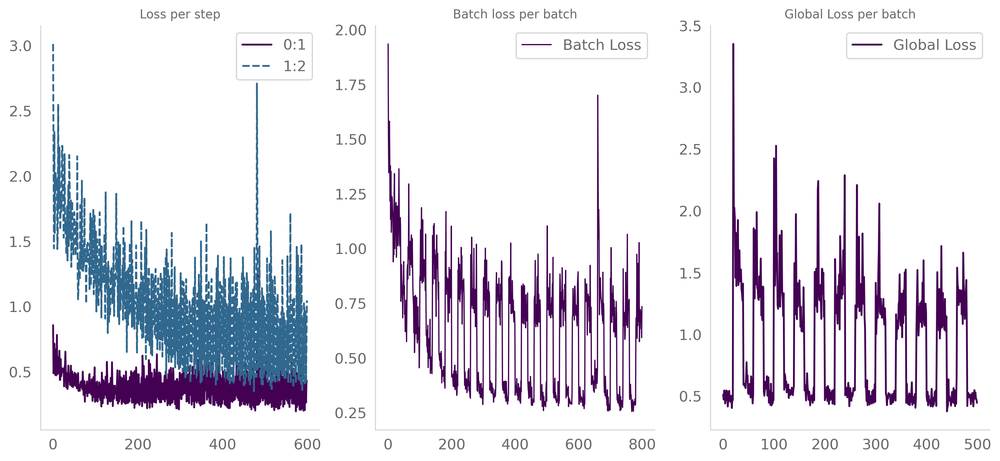

In [96]:
plot_losses(
    local_losses, batch_losses, globe_losses, 
    save=True, path=exp_dir, file='losses.png'
)

In [97]:
generated, trajectoriespts = generate_plot_data(
    model, df, n_points, n_trajectories, n_bins, use_cuda=use_cuda, samples_key='samples', logger=logger,
    autoencoder=autoencoder, recon=recon
)

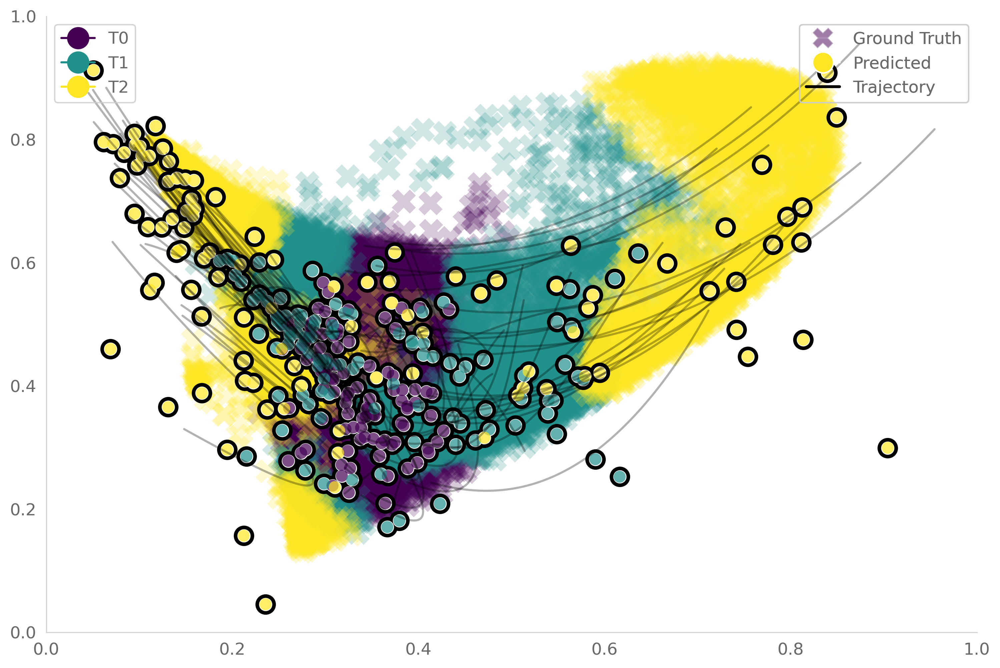

In [98]:
plot_comparision(
    df, generated, trajectoriespts,
    palette = 'viridis', df_time_key='samples',
    save=True, path=exp_dir, file='2d_comparision.png',
    x='d1', y='d2', is_3d=False
)

In [99]:
trajectoriespts = trajectoriespts * std_ + mean_
generated = generated * std_ + mean_
true_data = df[[f'd{i}' for i in range(1, len(df.columns))]] * std_ + mean_

In [100]:
from sklearn.preprocessing import MinMaxScaler

In [101]:
scaler = MinMaxScaler()
scaler.fit(true_data.values[:,:3])
trajectories(
    trajectoriespts[:,:,:3],
    fig=scatter(
        true_data.values[:,:3], 
        df['samples'].values,
        scaler=scaler,
        # rescale=False,
        s=1,
        alpha=1,
    ), 
    scaler=scaler,
    s=5,
    # rescale=False,
    filename=os.path.join(exp_dir, 'trajectories.html'),
    title='',
)

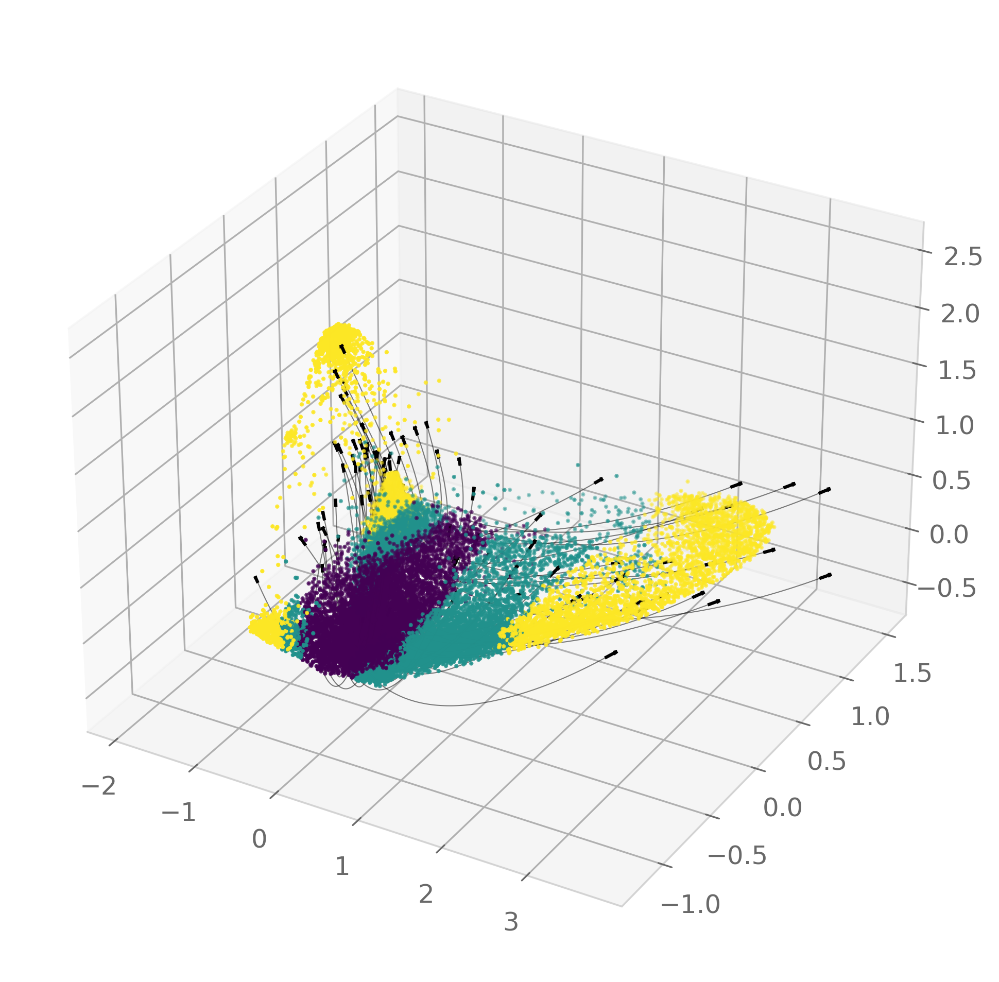

In [102]:
fig = plt.figure(figsize=(8, 8), dpi=300)
ax = fig.add_subplot(111, projection='3d')
ax.scatter(true_data.values[:, 0], true_data.values[:, 1], true_data.values[:, 2], c=df['samples'].values, cmap='viridis', s=1)
for i,traj in enumerate(np.transpose(trajectoriespts, axes=(1,0,2))):
    # widths = m_traj[:,i]
    ax.plot(traj[:, 0], traj[:, 1], traj[:, 2], alpha=.5, linewidth=.5, color='Black')
    # For 3D arrows, we need to use quiver instead of annotate
    arrow_length = 0.1
    dx = traj[-1, 0] - traj[-2, 0]
    dy = traj[-1, 1] - traj[-2, 1]
    dz = traj[-1, 2] - traj[-2, 2]
    # Normalize the direction vector
    magnitude = np.sqrt(dx**2 + dy**2 + dz**2)
    if magnitude > 0:
        dx, dy, dz = dx/magnitude*arrow_length, dy/magnitude*arrow_length, dz/magnitude*arrow_length
        ax.quiver(traj[-1, 0], traj[-1, 1], traj[-1, 2], dx, dy, dz, color='Black', arrow_length_ratio=0.3)


In [105]:
# saving the trajectories and generated points
np.save(os.path.join(exp_dir,'trajectories_phate.npy'),trajectoriespts)
np.save(os.path.join(exp_dir,'generated_phate.npy'),generated)
np.savez(os.path.join(exp_dir, 'normalize.npz'), mean=trajectories, std=std_)

In [106]:
#Temporary fix for the logger
import logging
for handler in logging.root.handlers[:]:
    logging.root.removeHandler(handler)

In [107]:
torch.save(model, exp_dir + '/model.pt')

In [108]:
torch.save(autoencoder, exp_dir + '/autoencoder.pt')